#  ***⭐ Introduction to CNNs and Computer Vision with Tensorflow:***
Computer vision is the practice of buiding algorithms which can discover patterns in a visual data. such as the camera of a self driving car recognizing the car in front.

## **Get the Data:**
The images we're working with are from Food101 dataset. (101 different classes of food): https://www.kaggle.com/datasets/dansbecker/food-101

However we've modified it to only use two classes (pizza and steak ) using the image data modification notebook:
https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/image_data_modification.ipynb

> ** 🔑 Note:** We start with smaller dataset so we can experiment quickly and figure out what works(or better yet what doesn't work) before scaling up.

In [ ]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip

--2023-07-05 03:28:04--  https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.202.128, 74.125.199.128, 172.253.117.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.202.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109540975 (104M) [application/zip]
Saving to: ‘pizza_steak.zip’

pizza_steak.zip     100%[===================>] 104.47M   200MB/s    in 0.5s    

2023-07-05 03:28:04 (200 MB/s) - ‘pizza_steak.zip’ saved [109540975/109540975]



In [ ]:
import zipfile

In [ ]:
#Unzip the data
zip_ref= zipfile.ZipFile("pizza_steak.zip")
zip_ref.extractall()
zip_ref.close()

## Inspect the data (become one with it)
The most crucial step in a machine learning project.

In computer vision, it means visualizing the data as much as possible to understand it

In [ ]:
!ls pizza_steak

test  train


In [ ]:
!ls pizza_steak/train/steak/

1000205.jpg  1647351.jpg  2238681.jpg  2824680.jpg  3375959.jpg  417368.jpg
100135.jpg   1650002.jpg  2238802.jpg  2825100.jpg  3381560.jpg  4176.jpg
101312.jpg   165639.jpg   2254705.jpg  2826987.jpg  3382936.jpg  42125.jpg
1021458.jpg  1658186.jpg  225990.jpg   2832499.jpg  3386119.jpg  421476.jpg
1032846.jpg  1658443.jpg  2260231.jpg  2832960.jpg  3388717.jpg  421561.jpg
10380.jpg    165964.jpg   2268692.jpg  285045.jpg   3389138.jpg  438871.jpg
1049459.jpg  167069.jpg   2271133.jpg  285147.jpg   3393547.jpg  43924.jpg
1053665.jpg  1675632.jpg  227576.jpg   2855315.jpg  3393688.jpg  440188.jpg
1068516.jpg  1678108.jpg  2283057.jpg  2856066.jpg  3396589.jpg  442757.jpg
1068975.jpg  168006.jpg   2286639.jpg  2859933.jpg  339891.jpg	 443210.jpg
1081258.jpg  1682496.jpg  2287136.jpg  286219.jpg   3417789.jpg  444064.jpg
1090122.jpg  1684438.jpg  2291292.jpg  2862562.jpg  3425047.jpg  444709.jpg
1093966.jpg  168775.jpg   229323.jpg   2865730.jpg  3434983.jpg  447557.jpg
1098844.jpg  1697

In [ ]:
!ls pizza_steak/train/pizza

1008104.jpg  1638227.jpg  2235981.jpg  2774899.jpg  3464027.jpg  576236.jpg
1008144.jpg  1646974.jpg  2236914.jpg  2775763.jpg  3464858.jpg  5764.jpg
1008844.jpg  1649108.jpg  2241448.jpg  2778214.jpg  3473991.jpg  579691.jpg
1008941.jpg  1649276.jpg  2247711.jpg  277963.jpg   3475936.jpg  593400.jpg
1011404.jpg  1652943.jpg  2253670.jpg  2785084.jpg  3478964.jpg  59445.jpg
102037.jpg   1654444.jpg  2255361.jpg  2793535.jpg  3479875.jpg  596494.jpg
1026922.jpg  1660415.jpg  2274117.jpg  27963.jpg    3479936.jpg  598381.jpg
1029698.jpg  1663749.jpg  2279642.jpg  2800325.jpg  3484590.jpg  604977.jpg
1033251.jpg  1665654.jpg  2280345.jpg  2811032.jpg  3493457.jpg  608085.jpg
1035854.jpg  166823.jpg   2285269.jpg  282013.jpg   349946.jpg	 618021.jpg
1038357.jpg  1670471.jpg  2285942.jpg  2821034.jpg  350358.jpg	 61822.jpg
1040878.jpg  1671531.jpg  228778.jpg   2821048.jpg  3505182.jpg  618348.jpg
1044524.jpg  1678284.jpg  2291093.jpg  2827938.jpg  3512070.jpg  625687.jpg
1044789.jpg  16810

In [ ]:
import os
#lets walk through the directories
for dirpath, dirname , filename in os.walk("pizza_steak"):
  print(f"There are {len(dirname)} directories and {len(filename)} images in {dirpath}}}")

There are 2 directories and 0 images in pizza_steak}
There are 2 directories and 0 images in pizza_steak/train}
There are 0 directories and 750 images in pizza_steak/train/steak}
There are 0 directories and 750 images in pizza_steak/train/pizza}
There are 2 directories and 0 images in pizza_steak/test}
There are 0 directories and 250 images in pizza_steak/test/steak}
There are 0 directories and 250 images in pizza_steak/test/pizza}


In [ ]:
#Another way to find out how many images are in a file
num_steak= len(os.listdir("pizza_steak/train/steak"))
num_steak

750

### Visualizing images

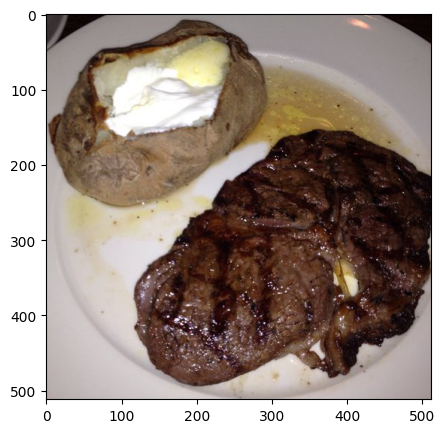

In [ ]:
#viewing a single image
import matplotlib.pyplot as plt
plt.figure(figsize=(5,5))
image= plt.imread(fname="pizza_steak/train/steak/3670607.jpg")
plt.imshow(image)

In [ ]:
import tensorflow as tf
img= tf.constant(image)
img

<tf.Tensor: shape=(512, 512, 3), dtype=uint8, numpy=
array([[[ 66,  57,  58],
        [ 64,  55,  56],
        [ 62,  53,  54],
        ...,
        [ 10,   1,   2],
        [ 10,   1,   2],
        [ 10,   1,   2]],

       [[ 67,  58,  59],
        [ 65,  56,  57],
        [ 63,  54,  55],
        ...,
        [ 10,   1,   2],
        [ 10,   1,   2],
        [ 10,   1,   2]],

       [[ 68,  59,  60],
        [ 66,  57,  58],
        [ 64,  55,  56],
        ...,
        [ 11,   2,   3],
        [ 12,   3,   4],
        [ 12,   3,   4]],

       ...,

       [[179, 167, 167],
        [179, 167, 167],
        [179, 167, 167],
        ...,
        [160, 148, 148],
        [159, 147, 147],
        [159, 147, 147]],

       [[179, 167, 167],
        [179, 167, 167],
        [179, 167, 167],
        ...,
        [159, 147, 147],
        [159, 147, 147],
        [159, 147, 147]],

       [[179, 167, 167],
        [179, 167, 167],
        [179, 167, 167],
        ...,
        [159, 147, 14

In [ ]:
#viewing multiple random images of each class
def view_random():
  plt.figure(figsize=(10,5))
  pizza= "pizza_steak/train/pizza"
  steak= "pizza_steak/train/steak"
  rn= np.random.randint(len(os.listdir(pizza)))
  image_1= plt.imread(f"{pizza}/{os.listdir(pizza)[rn]}")
  image_2=plt.imread(f"{steak}/{os.listdir(steak)[rn]}")
  plt.subplot(1,2,1)
  plt.imshow(image_1)
  plt.title("Pizza")
  plt.subplot(1,2,2)
  plt.imshow(image_2)
  plt.title("Steak")

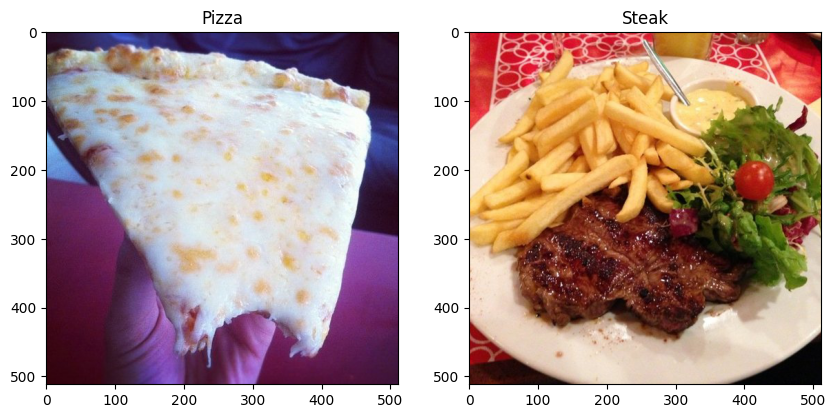

In [ ]:
import numpy as np
view_random()

# **End-to-end CNN Model**
Let's build a CNN to finad patterns in our images. Steps will be the following:
* Load our data
* Preprocess our images
* Build a CNN
* Fit the CNN to our model

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#set the seed
tf.random.set_seed(42)

#preprocess data (scaling/normalization)
train_dir="pizza_steak/train"
test_dir="pizza_steak/test"

train_datagen= ImageDataGenerator(rescale=1./255) #creating instance of the preprocessor
test_datagen=ImageDataGenerator(rescale=1./255)

train_data= train_datagen.flow_from_directory(directory=train_dir,
                                              target_size=(224,224),
                                              batch_size=32,
                                              seed=42,
                                              class_mode="binary")
test_data= test_datagen.flow_from_directory(directory= test_dir,
                                            batch_size=32,
                                            target_size=(224,224),
                                            seed=42,
                                            class_mode="binary")
#creating the model
model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu",
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation="sigmoid")
])

#compiling the model
model_1.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"]),

#fitting the model
model_1.fit(train_data,
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data=test_data,
            validation_steps= len(test_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/5
47/47 [==============================] - 24s 241ms/step - loss: 0.5451 - accuracy: 0.7187 - val_loss: 0.4151 - val_accuracy: 0.8320
Epoch 2/5
47/47 [==============================] - 10s 219ms/step - loss: 0.4195 - accuracy: 0.8087 - val_loss: 0.3706 - val_accuracy: 0.8240
Epoch 3/5
47/47 [==============================] - 12s 266ms/step - loss: 0.4169 - accuracy: 0.8080 - val_loss: 0.3831 - val_accuracy: 0.8140
Epoch 4/5
47/47 [==============================] - 11s 226ms/step - loss: 0.3748 - accuracy: 0.8353 - val_loss: 0.3308 - val_accuracy: 0.8500
Epoch 5/5
47/47 [==============================] - 15s 325ms/step - loss: 0.3334 - accuracy: 0.8593 - val_loss: 0.3102 - val_accuracy: 0.8740


In [ ]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

## Using our previous model from tf playground on this data

In [ ]:
tf.random.set_seed(42)

model_2= tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224,224,3)),
    tf.keras.layers.Dense(100,activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

model_2.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(lr=0.01),
                metrics=["accuracy"])

model_2.fit(train_data,
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data= test_data,
            validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 12s 219ms/step - loss: 2.6601 - accuracy: 0.6547 - val_loss: 0.8592 - val_accuracy: 0.6380
Epoch 2/5
47/47 [==============================] - 9s 196ms/step - loss: 0.8160 - accuracy: 0.6793 - val_loss: 0.4335 - val_accuracy: 0.8040
Epoch 3/5
47/47 [==============================] - 10s 205ms/step - loss: 0.5825 - accuracy: 0.7367 - val_loss: 0.4538 - val_accuracy: 0.7780
Epoch 4/5
47/47 [==============================] - 10s 211ms/step - loss: 0.5399 - accuracy: 0.7620 - val_loss: 0.4251 - val_accuracy: 0.8020
Epoch 5/5
47/47 [==============================] - 11s 239ms/step - loss: 0.6248 - accuracy: 0.7360 - val_loss: 0.7458 - val_accuracy: 0.6660


In [ ]:
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 150528)            0         
                                                                 
 dense_1 (Dense)             (None, 100)               15052900  
                                                                 
 dense_2 (Dense)             (None, 100)               10100     
                                                                 
 dense_3 (Dense)             (None, 100)               10100     
                                                                 
 dense_4 (Dense)             (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


In [ ]:
## creating a baseline model
model_3= tf.keras.Sequential([
    tf.keras.layers.Conv2D(
        filters=10,
        kernel_size=(3,3),
        strides=(1,1),
        padding="valid",
        activation="relu"
    ),
    tf.keras.layers.Conv2D(
        filters=10,
        kernel_size=(3,3),
        strides=(1,1),
        padding="valid",
        activation="relu"
    ),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

model_3.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics="accuracy"),
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")
history_3=model_3.fit(train_data, epochs=5,
            steps_per_epoch=len(train_data),
            validation_data=test_data,
            validation_steps=len(test_data),
            callbacks=[tensorboard_callback])

Epoch 1/5
47/47 [==============================] - 13s 239ms/step - loss: 0.8739 - accuracy: 0.6640 - val_loss: 0.4150 - val_accuracy: 0.8020
Epoch 2/5
47/47 [==============================] - 11s 231ms/step - loss: 0.4231 - accuracy: 0.8100 - val_loss: 0.3720 - val_accuracy: 0.8400
Epoch 3/5
47/47 [==============================] - 11s 226ms/step - loss: 0.3419 - accuracy: 0.8573 - val_loss: 0.3355 - val_accuracy: 0.8560
Epoch 4/5
47/47 [==============================] - 10s 220ms/step - loss: 0.2601 - accuracy: 0.9140 - val_loss: 0.3245 - val_accuracy: 0.8600
Epoch 5/5
47/47 [==============================] - 10s 210ms/step - loss: 0.1413 - accuracy: 0.9567 - val_loss: 0.3537 - val_accuracy: 0.8480


<Axes: >

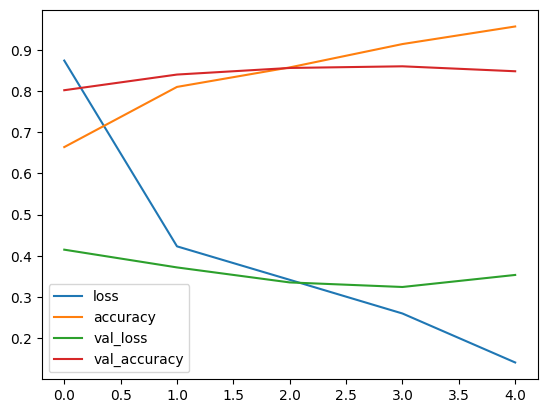

In [ ]:
import pandas as pd
pd.DataFrame(history_3.history).plot()

cant get enough ut of this plot. lets plot it separately

In [ ]:
def plot_curves(history):
  # plt.figure(figsize=(10,7))
  accuracy=history.history['accuracy']
  val_accuracy= history.history['val_accuracy']
  loss=history.history['loss']
  val_loss= history.history['val_loss']
  epoch= range(len(loss))
  plt.figure()
  plt.plot(epoch,loss)
  plt.plot(epoch, val_loss)
  plt.title("loss")
  plt.legend(['loss','val_loss'])
  plt.figure()
  plt.plot(epoch, accuracy)
  plt.plot(epoch, val_accuracy)
  plt.title("accuracy")
  plt.legend(['accuracy','val_accuracy'])

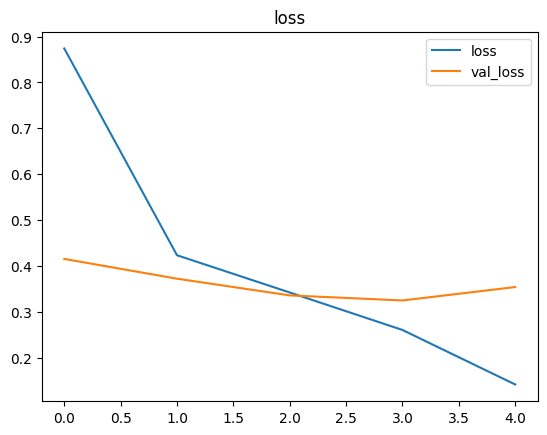

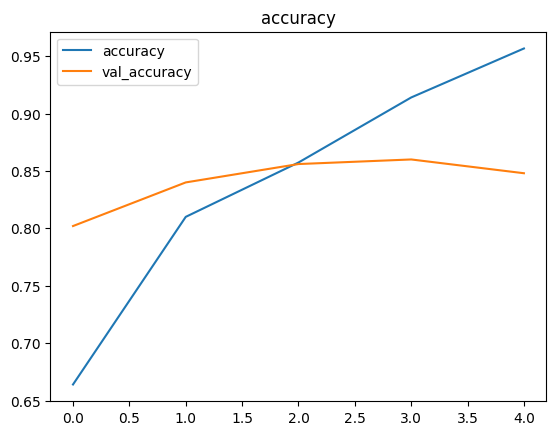

In [ ]:
plot_curves(history_3)

> 🔑 Note: when validation losss is increasing and accuracy is not also, when the loss is decreased and accuracy is higher it means the model is overfitting.

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir "/content/logs"

<IPython.core.display.Javascript object>

Steps to modelling:
1. create a baseline model
2. overfit it
3. reduce overfitting

steps to induce overfitting:
1. add more conv layers
2. increase number of conv filters
3. add another dense layer to the output of flattened layer

steps to reduce overfitting
1. add data augmentation
2. add regularization layers such as MaxPool2D
3. add more data

In [ ]:
#creating a baseline model
model_4= tf.keras.Sequential([
    tf.keras.layers.Conv2D(10,3,1, activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(10,3,activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(10,3,activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model_4.compile(loss='binary_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

history_4=model_4.fit(train_data,
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data=test_data,
            validation_steps=len(test_data),
            callbacks=[tensorboard_callback])

Epoch 1/5
47/47 [==============================] - 13s 228ms/step - loss: 0.6359 - accuracy: 0.6367 - val_loss: 0.4825 - val_accuracy: 0.7780
Epoch 2/5
47/47 [==============================] - 10s 206ms/step - loss: 0.4872 - accuracy: 0.7707 - val_loss: 0.3871 - val_accuracy: 0.8300
Epoch 3/5
47/47 [==============================] - 10s 211ms/step - loss: 0.4526 - accuracy: 0.7993 - val_loss: 0.4480 - val_accuracy: 0.7920
Epoch 4/5
47/47 [==============================] - 10s 215ms/step - loss: 0.4195 - accuracy: 0.8167 - val_loss: 0.3727 - val_accuracy: 0.8380
Epoch 5/5
47/47 [==============================] - 10s 219ms/step - loss: 0.3967 - accuracy: 0.8240 - val_loss: 0.3518 - val_accuracy: 0.8440


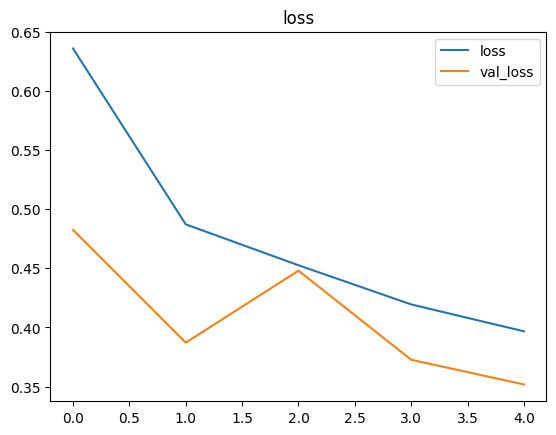

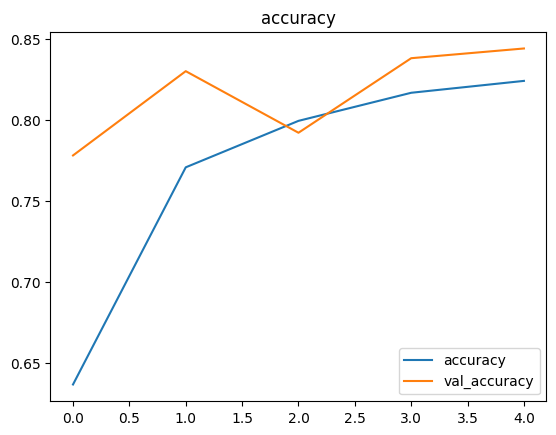

In [ ]:
plot_curves(history_4)

## Data Augmentation

In [ ]:
train_datagen_augmented= ImageDataGenerator(rescale=1./255,
                                            shear_range=0.2,
                                            rotation_range=0.2,
                                            zoom_range=0.2,
                                            height_shift_range=0.3,
                                            horizontal_flip=True,
                                            width_shift_range=0.2)
train_datagen=ImageDataGenerator(rescale=1./255)
test_datagen= ImageDataGenerator(rescale=1./255)

In [ ]:
train_data_augmented= train_datagen_augmented.flow_from_directory("/content/pizza_steak/train",
                                                                  target_size=(224,224),
                                                                  class_mode='binary',
                                                                  shuffle=False)

Found 1500 images belonging to 2 classes.


In [ ]:
train_data_augmented[0]

(array([[[[0.48816293, 0.43535125, 0.28767574],
          [0.5016073 , 0.44988573, 0.29753825],
          [0.5246747 , 0.4720487 , 0.31247744],
          ...,
          [0.6057321 , 0.5899975 , 0.38738683],
          [0.593543  , 0.59247535, 0.39944002],
          [0.57584625, 0.58336043, 0.4100526 ]],
 
         [[0.5025631 , 0.44926405, 0.29151437],
          [0.51089144, 0.45787975, 0.29926768],
          [0.5398067 , 0.48878968, 0.32419387],
          ...,
          [0.6105634 , 0.5891746 , 0.37689635],
          [0.6019744 , 0.5944298 , 0.38645628],
          [0.59004116, 0.59552544, 0.4015309 ]],
 
         [[0.4999706 , 0.4489902 , 0.2842843 ],
          [0.5092059 , 0.4582255 , 0.29351962],
          [0.5329328 , 0.48195243, 0.31724656],
          ...,
          [0.5967601 , 0.5727644 , 0.35696018],
          [0.5886351 , 0.57896227, 0.3616287 ],
          [0.5739788 , 0.57770866, 0.36753246]],
 
         ...,
 
         [[0.46349555, 0.5315602 , 0.42390466],
          [0.47376

In [ ]:
images, labels= train_data_augmented.next()

In [ ]:
images[0].shape

(224, 224, 3)

In [ ]:
labels[1]

0.0

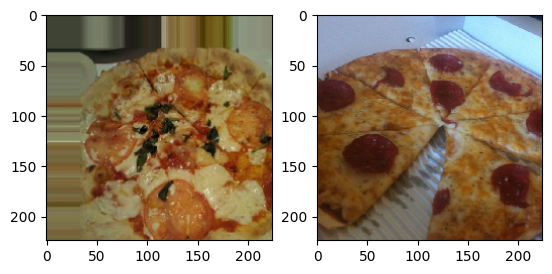

In [ ]:
plt.figure()
plt.subplot(1,2,1)
plt.imshow(images[0])
plt.subplot(1,2,2)
plt.imshow(train_data[0][0][0])

In [ ]:
train_aug_shuffled= train_datagen_augmented.flow_from_directory('/content/pizza_steak/train',
                                                                class_mode='binary',
                                                                target_size=(224,224),
                                                                shuffle=True)

Found 1500 images belonging to 2 classes.


In [ ]:
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential

In [ ]:
model_5= Sequential([
    Conv2D(filters=10, kernel_size=3, strides=1, activation='relu'),
    MaxPool2D(pool_size=2),
    Conv2D(10,3,activation='relu'),
    MaxPool2D(),
    Conv2D(10,3,activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation='sigmoid')
])
model_5.compile(loss='binary_crossentropy',
                optimizer=Adam(),
                metrics=['accuracy'])
history_5=model_5.fit(train_aug_shuffled,
            epochs=5,
            steps_per_epoch=len(train_aug_shuffled),
            validation_data= test_data,
            validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 26s 510ms/step - loss: 0.6767 - accuracy: 0.5560 - val_loss: 0.5788 - val_accuracy: 0.7160
Epoch 2/5
47/47 [==============================] - 24s 497ms/step - loss: 0.6220 - accuracy: 0.6587 - val_loss: 0.5206 - val_accuracy: 0.7440
Epoch 3/5
47/47 [==============================] - 24s 508ms/step - loss: 0.5555 - accuracy: 0.7247 - val_loss: 0.4356 - val_accuracy: 0.7900
Epoch 4/5
47/47 [==============================] - 24s 508ms/step - loss: 0.5175 - accuracy: 0.7580 - val_loss: 0.3716 - val_accuracy: 0.8340
Epoch 5/5
47/47 [==============================] - 24s 512ms/step - loss: 0.4826 - accuracy: 0.7707 - val_loss: 0.3962 - val_accuracy: 0.8280


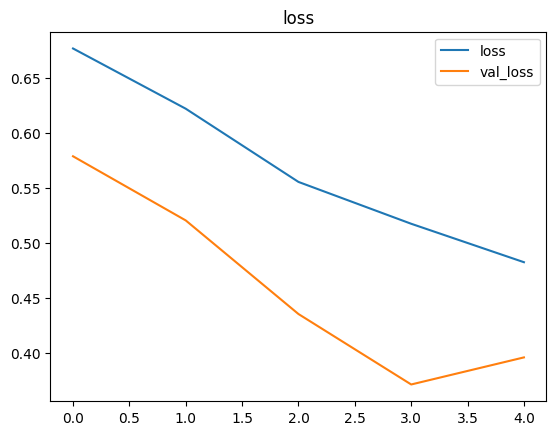

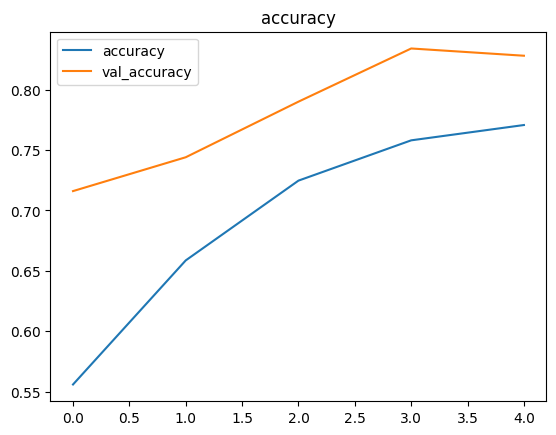

In [ ]:
plot_curves(history_5)

In [ ]:
model_6= Sequential([
    Conv2D(filters=10, kernel_size=3, strides=1, activation='relu'),
    MaxPool2D(pool_size=2),
    Conv2D(10,3,activation='relu'),
    MaxPool2D(2),
    Conv2D(10,3,activation='relu'),
    MaxPool2D(2),
    Flatten(),
    Dense(1, activation='sigmoid')
])

model_6.compile(loss='binary_crossentropy',
                optimizer=Adam(),
                metrics=['accuracy'])

history_6= model_6.fit(train_data_augmented,
                       epochs=5,
                       steps_per_epoch=len(train_data_augmented),
                       validation_data= test_data,
                       validation_steps=len(test_data))

Epoch 1/5
47/47 [==============================] - 26s 511ms/step - loss: 0.7683 - accuracy: 0.5393 - val_loss: 0.6924 - val_accuracy: 0.5260
Epoch 2/5
47/47 [==============================] - 24s 510ms/step - loss: 0.6922 - accuracy: 0.5013 - val_loss: 0.6883 - val_accuracy: 0.5120
Epoch 3/5
47/47 [==============================] - 24s 507ms/step - loss: 0.6900 - accuracy: 0.5287 - val_loss: 0.6862 - val_accuracy: 0.5580
Epoch 4/5
47/47 [==============================] - 26s 549ms/step - loss: 0.6786 - accuracy: 0.5840 - val_loss: 0.6789 - val_accuracy: 0.5280
Epoch 5/5
47/47 [==============================] - 24s 504ms/step - loss: 0.6891 - accuracy: 0.5500 - val_loss: 0.6637 - val_accuracy: 0.6160


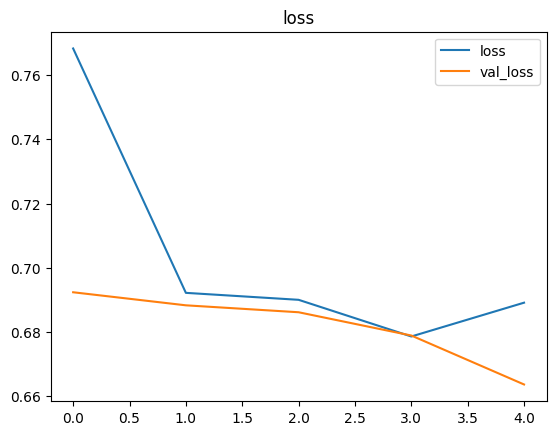

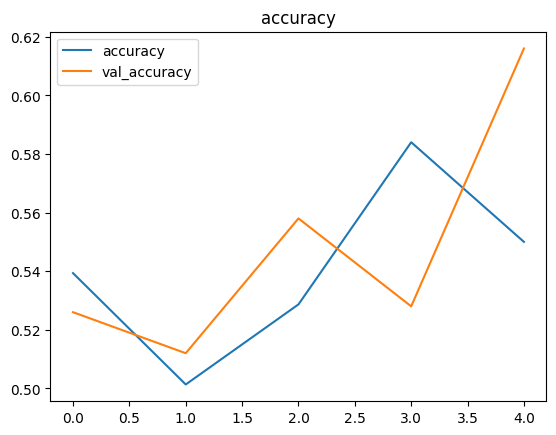

In [ ]:
plot_curves(history_6)

## using custom image

In [ ]:
def preprocess_img(filename, shape=(224,224)):
  img=tf.io.read_file(filename)
  img= tf.image.decode_image(img, channels=3)

  img= tf.image.resize(img,size=(224,224))
  img= img/255.
  img= tf.expand_dims(img, axis=0)
  return img

In [ ]:
filename= tf.keras.utils.get_file(fname='image.jpg', origin='https://th.bing.com/th/id/OIP.CsCxKLgElKLPm9VcuMCF2AHaKD?pid=ImgDet&rs=1', cache_subdir='/content/sample_data')

In [ ]:
img=preprocess_img('/content/sample_data/image.jpg')

In [ ]:
tf.round(model_5.predict(img))

1/1 [==============================] - 0s 18ms/step


<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.]], dtype=float32)>

In [ ]:
def decode_proba(probability,image_path=None, plot=False):
  if tf.round(probability)==1:
    print('This image is of Steak')
    if img!= None and plot:
      plt.figure()
      image=plt.imread(image_path)
      plt.imshow(image)
      plt.axis=False
    return 'steak'
  elif tf.round(probability)<1:
    print('This image is of Pizza')
    if img!= None and plot:
      plt.figure()
      image= plt.imread(image_path)
      plt.imshow(image)
      plt.axis=False
    return ('pizza')


1/1 [==============================] - 0s 31ms/step
This image is of Pizza


'pizza'

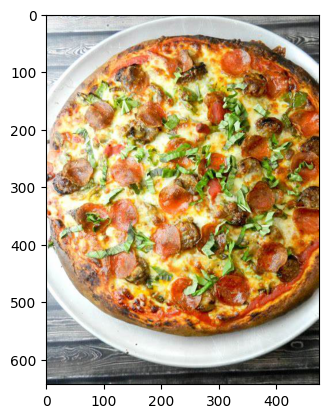

In [ ]:
decode_proba(model_5.predict(img), image_path='/content/sample_data/image.jpg', plot=True)

# Practicing Multiclass

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import zipfile

In [ ]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip

--2023-07-05 12:12:08--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.68.128, 64.233.170.128, 142.251.175.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.68.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip’

10_food_classes_all 100%[===================>] 495.13M  22.7MB/s    in 23s     

2023-07-05 12:12:32 (21.5 MB/s) - ‘10_food_classes_all_data.zip’ saved [519183241/519183241]



In [ ]:
!unzip /content/10_food_classes_all_data.zip

Streaming output truncated to the last 5000 lines.
  inflating: 10_food_classes_all_data/train/hamburger/2119225.jpg  
  inflating: __MACOSX/10_food_classes_all_data/train/hamburger/._2119225.jpg  
  inflating: 10_food_classes_all_data/train/hamburger/22923.jpg  
  inflating: __MACOSX/10_food_classes_all_data/train/hamburger/._22923.jpg  
  inflating: 10_food_classes_all_data/train/hamburger/3894442.jpg  
  inflating: __MACOSX/10_food_classes_all_data/train/hamburger/._3894442.jpg  
  inflating: 10_food_classes_all_data/train/hamburger/1101890.jpg  
  inflating: __MACOSX/10_food_classes_all_data/train/hamburger/._1101890.jpg  
  inflating: 10_food_classes_all_data/train/hamburger/2715888.jpg  
  inflating: __MACOSX/10_food_classes_all_data/train/hamburger/._2715888.jpg  
  inflating: 10_food_classes_all_data/train/hamburger/554363.jpg  
  inflating: __MACOSX/10_food_classes_all_data/train/hamburger/._554363.jpg  
  inflating: 10_food_classes_all_data/train/hamburger/2100953.jpg  
  inf

In [ ]:
import os
for directory, filnames, filepaths in os.walk('/content/10_food_classes_all_data'):
  print(f"{directory} has {len(filepaths)} files and {len(filnames)} folders")



/content/10_food_classes_all_data has 0 files and 2 folders
/content/10_food_classes_all_data/train has 0 files and 10 folders
/content/10_food_classes_all_data/train/steak has 750 files and 0 folders
/content/10_food_classes_all_data/train/ice_cream has 750 files and 0 folders
/content/10_food_classes_all_data/train/ramen has 750 files and 0 folders
/content/10_food_classes_all_data/train/hamburger has 750 files and 0 folders
/content/10_food_classes_all_data/train/grilled_salmon has 750 files and 0 folders
/content/10_food_classes_all_data/train/sushi has 750 files and 0 folders
/content/10_food_classes_all_data/train/fried_rice has 750 files and 0 folders
/content/10_food_classes_all_data/train/chicken_curry has 750 files and 0 folders
/content/10_food_classes_all_data/train/chicken_wings has 750 files and 0 folders
/content/10_food_classes_all_data/train/pizza has 750 files and 0 folders
/content/10_food_classes_all_data/test has 0 files and 10 folders
/content/10_food_classes_all_

In [ ]:
classes=os.listdir('/content/10_food_classes_all_data/train')

In [ ]:
print(classes)
len(classes)

['steak', 'ice_cream', 'ramen', 'hamburger', 'grilled_salmon', 'sushi', 'fried_rice', 'chicken_curry', 'chicken_wings', 'pizza']


10

In [ ]:
train_dir_1='10_food_classes_all_data/train'
test_dir_1='10_food_classes_all_data/test'

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
train_datagen=ImageDataGenerator(rescale=1/255.)
test_datagen=ImageDataGenerator(rescale=1/255.)

In [ ]:
test_data= test_datagen.flow_from_directory('10_food_classes_all_data/test',
                                            target_size=(224,224),
                                            classes=classes)
train_data= train_datagen.flow_from_directory('10_food_classes_all_data/train',
                                              target_size=(224,224),
                                              classes=classes)

Found 2500 images belonging to 10 classes.
Found 7500 images belonging to 10 classes.


In [ ]:
len(test_data)

79

In [ ]:
2500/32

78.125

In [ ]:
7500/32

234.375

In [ ]:
len(train_data)

235

In [ ]:
images, labels= train_data.next()

In [ ]:
len(images)

32

In [ ]:
images[0]

array([[[1.        , 0.9960785 , 1.        ],
        [1.        , 0.9960785 , 1.        ],
        [1.        , 0.9960785 , 1.        ],
        ...,
        [0.6392157 , 0.6039216 , 0.58431375],
        [0.6431373 , 0.6       , 0.58431375],
        [0.63529414, 0.5921569 , 0.5764706 ]],

       [[1.        , 0.9960785 , 1.        ],
        [1.        , 0.9960785 , 1.        ],
        [1.        , 0.9960785 , 1.        ],
        ...,
        [0.6392157 , 0.6039216 , 0.58431375],
        [0.64705884, 0.6039216 , 0.5882353 ],
        [0.6392157 , 0.59607846, 0.5803922 ]],

       [[1.        , 0.9960785 , 1.        ],
        [1.        , 0.9960785 , 1.        ],
        [1.        , 0.9960785 , 1.        ],
        ...,
        [0.64705884, 0.6039216 , 0.59607846],
        [0.64705884, 0.6039216 , 0.59607846],
        [0.6392157 , 0.59607846, 0.5882353 ]],

       ...,

       [[0.03137255, 0.03137255, 0.03137255],
        [0.02352941, 0.02352941, 0.02352941],
        [0.02745098, 0

In [ ]:
images[0].shape

(224, 224, 3)

In [ ]:
labels[0]

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)

In [ ]:
import random

In [ ]:
def plot_random_images(images, labels):
  rn=random.randrange(0,len(images))
  plt.figure()
  plt.imshow(images[rn])
  plt.title(classes[labels[rn].argmax()])


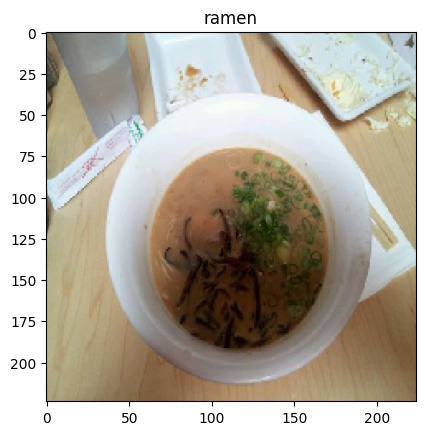

In [ ]:
plot_random_images(images, labels)

### Modelling

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy

In [ ]:
model_7= Sequential([
    Conv2D(filters=10, kernel_size=3, strides=1, input_shape=(224,224,3)),
    Activation('relu'),
    MaxPool2D(pool_size=2),
    Conv2D(10, 3,1),
    Activation('relu'),
    MaxPool2D(),
    Conv2D(10,3,1),
    Activation('relu'),
    Conv2D(10,3,1),
    Activation('relu'),
    MaxPool2D(),
    Flatten(),
    Dense(10),
    Activation('softmax')
])

model_7.compile(loss= CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics=['accuracy'])

In [ ]:
history_7=model_7.fit(train_data,
                      epochs=5,
                      steps_per_epoch=len(train_data),
                      validation_data=test_data,
                      validation_steps=len(test_data))

Epoch 1/5
235/235 [==============================] - 73s 264ms/step - loss: 2.1618 - accuracy: 0.1953 - val_loss: 2.0562 - val_accuracy: 0.2360
Epoch 2/5
235/235 [==============================] - 66s 283ms/step - loss: 1.9707 - accuracy: 0.3085 - val_loss: 1.9764 - val_accuracy: 0.3108
Epoch 3/5
235/235 [==============================] - 66s 281ms/step - loss: 1.8061 - accuracy: 0.3749 - val_loss: 1.9186 - val_accuracy: 0.3332
Epoch 4/5
235/235 [==============================] - 64s 273ms/step - loss: 1.6266 - accuracy: 0.4419 - val_loss: 1.9552 - val_accuracy: 0.3356
Epoch 5/5
235/235 [==============================] - 66s 283ms/step - loss: 1.4051 - accuracy: 0.5208 - val_loss: 2.0231 - val_accuracy: 0.3260


In [ ]:
def plot_curves(history):
  # plt.figure(figsize=(10,7))
  accuracy=history.history['accuracy']
  val_accuracy= history.history['val_accuracy']
  loss=history.history['loss']
  val_loss= history.history['val_loss']
  epoch= range(len(loss))
  plt.figure()
  plt.plot(epoch,loss)
  plt.plot(epoch, val_loss)
  plt.title("loss")
  plt.legend(['loss','val_loss'])
  plt.figure()
  plt.plot(epoch, accuracy)
  plt.plot(epoch, val_accuracy)
  plt.title("accuracy")
  plt.legend(['accuracy','val_accuracy'])

In [ ]:
def preprocess_img(filename, shape=(224,224)):
  img=tf.io.read_file(filename)
  img= tf.image.decode_image(img, channels=3)

  img= tf.image.resize(img,size=(224,224))
  img= img/255.
  img= tf.expand_dims(img, axis=0)
  return img

In [ ]:
def decode_proba(model,image_path,classes):
  image= preprocess_img(image_path)
  pred=model.predict(image)
  print(pred)
  pred= pred.argmax()
  print(pred)
  label= classes[pred]
  plt.figure()
  image=plt.imread(image_path)
  plt.imshow(image)
  plt.axis=False
  plt.title(label)
  return label

1/1 [==============================] - 0s 19ms/step
[[0.02318084 0.0091644  0.34542996 0.0195902  0.0163512  0.01096464
  0.5209717  0.01084145 0.0042157  0.03928994]]
6


'fried_rice'

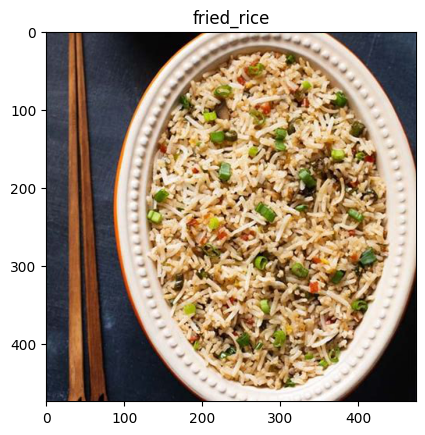

In [ ]:
decode_proba(model_7, '/content/th.jpeg',classes)

In [ ]:
model_7.save('/assets')

In [ ]:
model_8=tf.keras.models.load_model('/assets')

In [ ]:
model_8.evaluate(test_data)

79/79 [==============================] - 18s 215ms/step - loss: 2.0231 - accuracy: 0.3260


[2.0230579376220703, 0.32600000500679016]

In [ ]:
model_7.evaluate(test_data)

79/79 [==============================] - 12s 157ms/step - loss: 2.0231 - accuracy: 0.3260


[2.0230581760406494, 0.32600000500679016]

# *DONE*